In [1]:
!git clone https://github.com/blacksilvergeek/gpt_killer/

Cloning into 'gpt_killer'...
remote: Enumerating objects: 1195, done.
remote: Counting objects: 100% (284/284), done.
^Cmote: Compressing objects:   7% (12/168)
fetch-pack: unexpected disconnect while reading sideband packet


In [ ]:
!pip install mat73

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install torch_geometric

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 15.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910459 sha256=b634432a83b1cf18e9ad535fcc4bd93c6779146ee50b4dc7d82d1eef4ea1e15c
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
Successfully built torch_geometric


In [ ]:
%cd gpt_killer/Dataset
!pwd

/content/gpt_killer/Dataset
/content/gpt_killer/Dataset


In [2]:
import os
import zipfile
import torch
import torch_geometric
import WAN
import numpy as np
import mat73
#import torch
from torch.nn.functional import normalize

import networkx as nx
from networkx import from_numpy_array
from torch_geometric.data import Data,Dataset
from torch_geometric.utils import from_networkx
import json
dataset = 'authorshipData.mat' # store the human paper
# here the aim is to convert the text into WAN

# the data:
-----------------------------------------transferbility research--------------------------------------
- response: generated data only specify author
- response2: generated data specify author and topic
- response3: data specify differnt author and topic from human  but in the same randomness
- response4: data in different author/topic in differnt ranomness
- response5: this data is useless, i just restric it on high randomness
----------------
## training data set
- response_title, use the selected author and titles the same as human_data


In [4]:
for file in os.listdir():
    if file.endswith(".zip"):
        print("unzipping " + file)
        with zipfile.ZipFile(file, 'r') as zip_ref:
            zip_ref.extractall()
            print("unzipped " + file)

unzipping response_WANS.zip
unzipped response_WANS.zip
unzipping response5_WANS.txt.zip
unzipped response5_WANS.txt.zip
unzipping response2_WANS.txt.zip
unzipped response2_WANS.txt.zip
unzipping graph_dataset_response.txt.zip
unzipped graph_dataset_response.txt.zip
unzipping explanation_model2_transfer 2.txt.zip
unzipped explanation_model2_transfer 2.txt.zip
unzipping response3_WANS.txt.zip
unzipped response3_WANS.txt.zip
unzipping response4_WANS.txt.zip
unzipped response4_WANS.txt.zip
unzipping 10_poem.zip
unzipped 10_poem.zip
unzipping graph_dataset_response_title.txt.zip
unzipped graph_dataset_response_title.txt.zip
unzipping graph_dataset.txt.zip
unzipped graph_dataset.txt.zip
unzipping explanation_model2_transfer.txt.zip
unzipped explanation_model2_transfer.txt.zip
unzipping response4_WANS 2.txt.zip
unzipped response4_WANS 2.txt.zip
unzipping two_original_explanation.zip
unzipped two_original_explanation.zip
unzipping response4_WANS 3.txt.zip
unzipped response4_WANS 3.txt.zip


In [5]:
human_data = mat73.loadmat(dataset)
import pickle
with open("response_WANS",'rb') as f:
    (wordcounts,WANS)= pickle.load(f)
with open("response2_WANS.txt",'rb') as f:
    (val_wordcounts,val_WANS) =pickle.load(f)


with open("response3_WANS.txt",'rb') as f:
    val_wordcounts3, val_WANS3 = pickle.load(f)

with open("response4_WANS.txt",'rb') as f:
    val_wordcounts4, val_WANS4 = pickle.load(f)
with open("response5_WANS.txt",'rb') as f:
    val_wordcounts5, val_WANS5 = pickle.load(f)

In [6]:
len(WANS)

1812

In [7]:
np.array(WANS[0]).shape

(211, 211)

In [8]:
function_words = [word[0] for word in human_data['function_words']]

In [9]:
def load_gpt(function_words,windowWidth,file = "responses.json",content_index = -1):
    gpt_response = file
    gpt_papers = []
    WANS = []

    wordcounts = []
    with open(gpt_response,'r') as f:
        count = 0
        while(True):
            response = f.readline().strip()
            if response:
                #print("an error ",dict(eval(response)))
                try:
                    gpt_papers.append(dict(eval(response)))
                except:
                    count+=1
                    print("an error ",count)


            else:
                break
    print("valid dictionary",len(gpt_papers))
    for paper in gpt_papers:
        #paper = json.loads()

        papers = list(paper.items()) # all dictionary the last items is paper
        #print(papers)

        writer,novel = papers[content_index]
        #print(novel)

        #print(papers)
        #print(papers)




            # generate WAN for novel and store it in to gptWANs
        (text1Scores, text1Counts) = WAN.countFWs(WAN.cleanUp(novel),function_words,windowWidth)
        WAN1 = WAN.normalize(text1Scores)

        WANS.append(WAN1)
        wordcounts.append(text1Counts)
    return wordcounts, WANS

In [10]:
train_wordcounts, train_WANS = load_gpt(function_words[:211],5,"responses_title.json")


an error  1
an error  2
an error  3
valid dictionary 1146

Entering cleanUp()
Punctuation that will be removed: [',', '.', '!', '?', '"', ':', ';', ')', '(', '[', ']']
Text after punctuation and paragraphs processed:

Alexander the Great The Conqueror of the World

Alexander the Great was one of the most remarkable figures in the history of the world Born in 356 BC he was the son of King Philip II of Macedon and his wife Queen Olympia From a young age Alexander showed great promise as a leader and warrior and he was tutored by the famous philosopher Aristotle

When Alexander was just 20 years old his father was assassinated and he became king of Macedon He immediately set out to fulfill his father's dream of conquering the Persian Empire which was the most powerful empire in the world at that time

Alexander's military campaigns were legendary He led his army across the Hellespont and into Asia Minor where he defeated the Persian army at the Battle of Granicus He then marched south int

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



            [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1762545899632803, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 2 which is 'of'
        Looking in window at word number 3 which is 'nature'
        Looking in window at word number 4 which is 'from'
        Looking in window at word number 0 which is 'nature'
        Looking in window at word number 1 which is 'from'
        Looking in window at word number 2 which is 'the'
        Looking in window at word number 3 which is 'towering'
        Looking in window at word number 4 which is 'pines'
        Looking in window at word number 0 which is 'the'
        Looking in window at word number 1 which is 'towering'
        Looking in window at word number 2 which is 'pines'
        Looking in window at word number 3 which is 'to'
        Looking in window at word number 4 which is 'the'
        Looking in window at word number 0 which is 'towering'
        Looking in window at word number 1 which is 'pines'
        Looking in window at word number 2 which is 'to'
        Looking in window at word number 3 whi

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



            [0.24583866837387963, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.18437900128040974, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.32778489116517284, 0.0, 0.10371318822023047, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1382842509603073, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 0 which is 'to'
        Looking in window at word number 1 which is 'think'
        Looking in window at word number 2 which is 'that'
        Looking in window at word number 3 which is 'happiness'
        Looking in window at word number 4 which is 'could'
        Looking in window at word number 0 which is 'think'
        Looking in window at word number 1 which is 'that'
        Looking in window at word number 2 which is 'happiness'
        Looking in window at word number 3 which is 'could'
        Looking in window at word number 4 which is 'only'
        Looking in window at word number 0 which is 'happiness'
        Looking in window at word number 1 which is 'could'
        Looking in window at word number 2 which is 'only'
        Looking in window at word number 3 which is 'be'
        Looking in window at word number 4 which is 'found'
        Looking in window at word number 0 which is 'only'
        Looking in window at word numbe

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 2 which is 'danger'
        Looking in window at word number 3 which is 'and'
        Looking in window at word number 4 which is 'the'
        Looking in window at word number 0 which is 'the'
        Looking in window at word number 1 which is 'danger'
        Looking in window at word number 2 which is 'and'
        Looking in window at word number 3 which is 'the'
        Looking in window at word number 4 which is 'hardships'
        Looking in window at word number 0 which is 'danger'
        Looking in window at word number 1 which is 'and'
        Looking in window at word number 2 which is 'the'
        Looking in window at word number 3 which is 'hardships'
        Looking in window at word number 4 which is 'he'
        Looking in window at word number 0 which is 'the'
        Looking in window at word number 1 which is 'hardships'
        Looking in window at word number 2 which is 'he'
        Looking in window at word number 3 whic

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 4 which is 'live'
        Looking in window at word number 0 which is 'place'
        Looking in window at word number 1 which is 'to'
        Looking in window at word number 2 which is 'live'
        Looking in window at word number 3 which is 'it'
        Looking in window at word number 4 which is 'was'
        Looking in window at word number 0 which is 'live'
        Looking in window at word number 1 which is 'it'
        Looking in window at word number 2 which is 'was'
        Looking in window at word number 3 which is 'a'
        Looking in window at word number 4 which is 'way'
        Looking in window at word number 0 which is 'was'
        Looking in window at word number 1 which is 'a'
        Looking in window at word number 2 which is 'way'
        Looking in window at word number 3 which is 'of'
        Looking in window at word number 4 which is 'life'
        Looking in window at word number 0 which is 'way'
        Looking 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 0 which is 'spencer'
        Looking in window at word number 1 which is 'brydon'
        Looking in window at word number 2 which is 'stood'
        Looking in window at word number 3 which is 'in'
        Looking in window at word number 4 which is 'the'
        Looking in window at word number 0 which is 'the'
        Looking in window at word number 1 which is 'middle'
        Looking in window at word number 2 which is 'of'
        Looking in window at word number 3 which is 'the'
        Looking in window at word number 4 which is 'room'
        Looking in window at word number 0 which is 'middle'
        Looking in window at word number 1 which is 'of'
        Looking in window at word number 2 which is 'the'
        Looking in window at word number 3 which is 'room'
        Looking in window at word number 4 which is 'he'
        Looking in window at word number 0 which is 'the'
        Looking in window at word number 1 which is 'room'


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [11]:
def generate_graphs(wordcounts,WANS2):
    Graphs = []
    count=0
    for i in range(len(wordcounts)):
        adj_matrix = np.array(WANS2[i])
        #print(val_wordcounts,adj_matrix)
        try:
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)

            edge_index = data.edge_index
            edge_attr = data.weight
            signal = torch.tensor(wordcounts[i],dtype =torch.float64 )

            signal = (signal-signal.mean())/(signal.std())

            g = Data(x = signal.reshape(-1,1), edge_index = edge_index,edge_attr = edge_attr,y = torch.tensor([[0]])) # i define chat gpt's label as zero
            Graphs.append(g)
        except:
            count+=1
            print(data)
            print(count)

    return Graphs

In [12]:
train_Graphs = generate_graphs(train_wordcounts,train_WANS)

In [13]:
for i in range(len(human_data["all_authors"])):
    print(human_data["all_authors"][i])
    author_excerpts = torch.tensor(human_data["all_wans"][i])

    num_papers = author_excerpts.shape[-1]
    for num in range(92):#num_papers): # keep balanced num between true/false samples
        adj_matrix = author_excerpts[:,:,num]
        signal = human_data["all_freqs"][i][:,num].reshape(-1,1)
        signal = torch.tensor(signal,dtype=torch.float64)
        signal = (signal-signal.mean())/(signal.std())
        y = torch.tensor([[1]])
        adj_matrix = np.array(adj_matrix)

        adj_matrix /= (adj_matrix.sum(axis = 1).reshape(-1,1)+0.0000001)
        graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

        data = from_networkx(graph)
        edge_index = data.edge_index
        edge_attr = data.weight
        g = Data(x = signal, edge_index = edge_index,edge_attr = edge_attr,y = y) # i define chat gpt's label as zero
        train_Graphs.append(g)

['abbott']
['stevenson']
['alcott']
['alger']
['allen']
['austen']
['bronte']
['cooper']
['dickens']
['garland']
['hawthorne']
['james']
['melville']
['page']
['thoreau']
['twain']
['doyle']
['irving']
['poe']
['jewett']
['wharton']


In [14]:
with open("graph_dataset_response_title.txt",'wb') as f:
    pickle.dump(train_Graphs,f)

In [15]:
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split
train_test = train_test_split(train_Graphs,train_size = 0.7,test_size = 0.3, shuffle=True)
print(len(train_Graphs),train_Graphs[12])
train_loader = DataLoader(train_test[0],batch_size = 128)
test_loader =  DataLoader(train_test[1],batch_size = 128)

3078 Data(x=[211, 1], edge_index=[2, 156], edge_attr=[156], y=[1, 1])


In [16]:
# get all y of train_Graphs
_y = []
for graph in train_Graphs:
    _y.append(graph.y.item())
# get number of 1 and 0
print(_y.count(1),_y.count(0))

1932 1146


In [17]:
# all different number in _y
print(set(_y))

{0, 1}


### SVM

In [18]:
# svm
from sklearn import svm
from sklearn.model_selection import cross_val_score

svm_x = []
svm_y = []
for graph in train_Graphs:
    svm_x.append(np.array(graph.x).flatten())
    svm_y.append(np.array(graph.y).flatten())
# convert to array
svm_x = np.array(svm_x)
svm_y = np.array(svm_y).flatten()

# pca to 10d
from sklearn.decomposition import PCA
#pca = PCA(n_components=10)
#pca.fit(svm_x)
#svm_x = pca.transform(svm_x)



# train_test_split
from sklearn.model_selection import train_test_split
x_train_svm, x_test_svm, y_train_svm, y_test_svm = train_test_split(svm_x, svm_y, test_size=0.2, random_state=0)


# train svm
clf = svm.SVC()
clf.fit(x_train_svm, y_train_svm)

# test svm
clf.score(x_test_svm,y_test_svm)


0.9902597402597403

In [34]:
from torch.nn import Module,Linear,ReLU,Dropout,Sigmoid,ModuleList
from torch.nn.functional import tanh
from torch_geometric.nn import GCNConv
class GCNN(Module):
    def __init__(self,in_channel,hidden_channels,out_channel,dropout_rate,resize_num =211 ):
        super().__init__()
        self.convs = []

        prev_channels = in_channel
        for channel in hidden_channels:
            self.convs.append(GCNConv(prev_channels,channel))
            prev_channels = channel
        self.convs = torch.nn.ModuleList(self.convs)
        self.linear = Linear(prev_channels*resize_num,out_channel)
        self.relu = ReLU()
        self.dropout = Dropout(dropout_rate)
        self.sigmoid = Sigmoid()
        self.tanh = tanh

    def forward(self,x,edge_index,edge_attr,batch_size = 128):
        #print(x.reshape(batch_size,-1))
        for i, conv in enumerate(self.convs):


            x = conv(x,edge_index,edge_attr)
            x = self.dropout(x)
            if i != len(self.convs)-1:
                x = self.relu(x)
        #print(x.reshape(batch_size,-1))
        x = x.reshape(batch_size,-1)
        #print(x)
        #x = self.tanh(x)
        x = self.linear(x)
        x = self.sigmoid(x)
        #print(x)


        return x



model = GCNN(1,[8,1],1,dropout_rate = 0.5)

In [35]:
# class_weights = torch.tensor([1,2])
loss = torch.nn.BCELoss()

optimizer = torch.optim.Adam(model.parameters(),lr = 0.001)
def train(model,criteria,optimizer,epoch,train_loader,test,test_loader):
    train_accs = []
    test_accs = []
    for i in range(epoch):
        losses = 0
        total_count = 0
        accs = 0
        for batch in train_loader:
            #print(batch)
            optimizer.zero_grad()
            x = batch.x

            edge_index = batch.edge_index
            edge_attr = batch.edge_attr
            batch_size  = batch.y.shape[0]
            #print(batch_size)
            prediction = model.forward(x.float(),edge_index,edge_attr,batch.y.shape[0]).float()

            #print(prediction)


            loss = criteria(prediction,batch.y.float())
            loss.backward()
            optimizer.step()
            #accs = test(model,test_loader)
            losses+=loss
            total_count+=1

            prediction = prediction > 0.5


            accs += (prediction == batch.y).sum()/prediction.shape[0]

        test_acc = test(model,test_loader)
        print("epoch ",i," is ",loss/total_count," accs is ", accs/total_count)#," test acc ",accs)
        train_accs.append(accs/total_count)
        test_accs.append(test_acc)
    return train_accs, test_accs

def test(model,test_loader):
    total_count = 0
    accs = 0
    for batch in test_loader:
        x = batch.x
        edge_index = batch.edge_index
        edge_attr = batch.edge_attr
        #print(batch)
        prediction = model.forward(x.float(),edge_index,edge_attr,batch.y.shape[0]).float()
        total_count+=1
        prediction = prediction > 0.5
        accs += (prediction == batch.y).sum()/prediction.shape[0]
    #print("test  accs is ", accs/total_count)#," test acc ",accs)
    return accs/total_count

train_accs, test_accs = train(model,loss,optimizer,40,train_loader,test,test_loader)

epoch  0  is  tensor(0.0385, grad_fn=<DivBackward0>)  accs is  tensor(0.4936)
epoch  1  is  tensor(0.0349, grad_fn=<DivBackward0>)  accs is  tensor(0.6287)
epoch  2  is  tensor(0.0331, grad_fn=<DivBackward0>)  accs is  tensor(0.6729)
epoch  3  is  tensor(0.0316, grad_fn=<DivBackward0>)  accs is  tensor(0.7249)
epoch  4  is  tensor(0.0271, grad_fn=<DivBackward0>)  accs is  tensor(0.7987)
epoch  5  is  tensor(0.0235, grad_fn=<DivBackward0>)  accs is  tensor(0.8561)
epoch  6  is  tensor(0.0204, grad_fn=<DivBackward0>)  accs is  tensor(0.8876)
epoch  7  is  tensor(0.0178, grad_fn=<DivBackward0>)  accs is  tensor(0.9067)
epoch  8  is  tensor(0.0167, grad_fn=<DivBackward0>)  accs is  tensor(0.9327)
epoch  9  is  tensor(0.0132, grad_fn=<DivBackward0>)  accs is  tensor(0.9449)
epoch  10  is  tensor(0.0117, grad_fn=<DivBackward0>)  accs is  tensor(0.9426)
epoch  11  is  tensor(0.0106, grad_fn=<DivBackward0>)  accs is  tensor(0.9570)
epoch  12  is  tensor(0.0101, grad_fn=<DivBackward0>)  accs is

In [36]:
def true_predict(model,test_loader):
    total_count = 0
    accs = 0
    y_true = []
    y_pred = []
    for batch in test_loader:
        x = batch.x
        edge_index = batch.edge_index
        edge_attr = batch.edge_attr
        #print(batch)
        prediction = model.forward(x.float(),edge_index,edge_attr,batch.y.shape[0]).float()
        total_count+=1
        prediction = prediction > 0.5
        accs += (prediction == batch.y).sum()/prediction.shape[0]
        y_true.append(batch.y)
        y_pred.append(prediction)
    #print("test  accs is ", accs/total_count)#," test acc ",accs)
    y_true = torch.cat(y_true)
    y_pred = torch.cat(y_pred)
    return y_true,y_pred
from sklearn.metrics import confusion_matrix


y_true,y_pred = true_predict(model,test_loader)

In [37]:
### all in one score
## accs recall and precision F1 microF1 at the same time
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score


def score_all_in_one(y_true,y_pred):
    accs = accuracy_score(y_true,y_pred)
    precision,recall,f1,_ = precision_recall_fscore_support(y_true,y_pred,average='binary')
    microF1 = f1_score(y_true,y_pred,average='micro')
    # reture all the value
    return accs,precision,recall,f1,microF1



In [38]:
score_all_in_one(y_true,y_pred)

(0.987012987012987,
 0.9830220713073005,
 0.9965576592082617,
 0.9897435897435898,
 0.987012987012987)

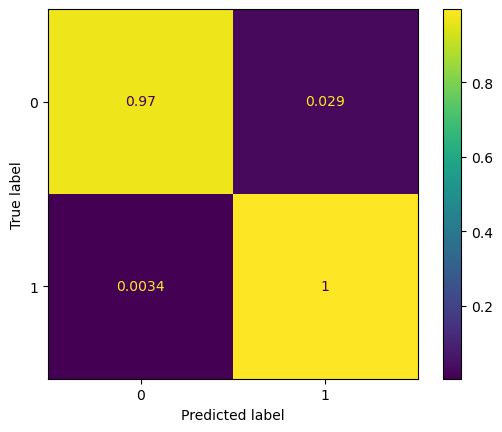

In [39]:
# import ConfusionMatrixDisplay
from sklearn.metrics import ConfusionMatrixDisplay
# plot confusion matrix
cm = confusion_matrix(y_true,y_pred,normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

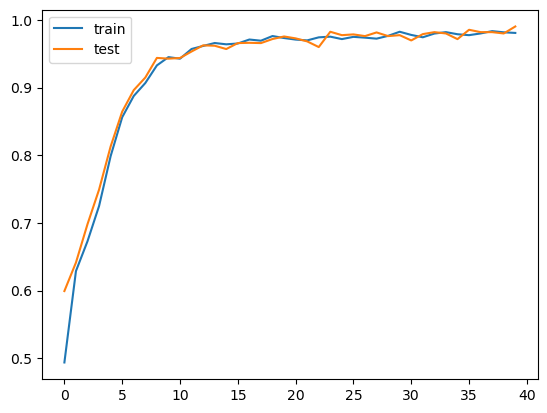

In [40]:
import matplotlib.pyplot as plt
plt.plot(train_accs,label = "train")
plt.plot(test_accs,'-',label = "test")
plt.legend()
plt.show()

In [41]:
from torch_geometric.explain import Explainer, GNNExplainer
from torch_geometric.data import Batch

In [42]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)


In [43]:

data = Batch.from_data_list(train_Graphs)

In [44]:
node_mask = np.empty((211,1))
count = 0

explanation = explainer(data.x.float(),data.edge_index,target = data.y,edge_attr = data.edge_attr,batch_size = data.y.shape[0])



/Users/asdfasd/opt/anaconda3/envs/deeplearning/lib/python3.7/site-packages/torch_geometric/explain/explainer.py:190: UserWarning: The 'target' should not be provided for the explanation type 'model'
  f"The 'target' should not be provided for the explanation "


In [45]:
node_mask = explanation.node_mask

In [46]:
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)

torch.Size([211, 3078])
torch.Size([211])


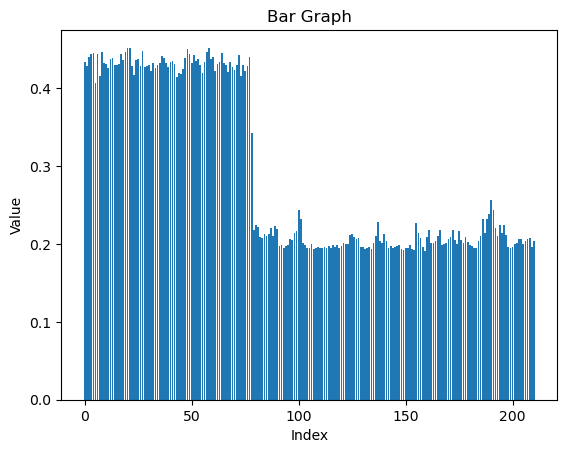

In [47]:
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

# try attention mechnisum

In [48]:
from torch_geometric.nn import ChebConv,GATConv
class GAT(Module):
    def __init__(self,in_channel,hidden_channels,out_channel,dropout_rate,resize_num =211 ):
        super().__init__()
        self.convs = []

        prev_channels = in_channel
        for channel in hidden_channels:
            self.convs.append(GATConv(prev_channels,channel,head = 2))
            prev_channels = channel
        self.convs = torch.nn.ModuleList(self.convs)
        self.linear = Linear(prev_channels*resize_num,out_channel)
        self.relu = ReLU()
        self.dropout = Dropout(dropout_rate)
        self.sigmoid = Sigmoid()
        self.tanh = tanh

    def forward(self,x,edge_index,edge_attr,batch_size = 128):
        #print(x.reshape(batch_size,-1))
        for i, conv in enumerate(self.convs):


            x = conv(x,edge_index,edge_attr)
            x = self.dropout(x)
            if i != len(self.convs)-1:
                x = self.relu(x)
        #print(x.reshape(batch_size,-1))
        x = x.reshape(batch_size,-1)
        #print(x)
        x = self.tanh(x)
        x = self.linear(x)
        x = self.sigmoid(x)
        #print(x)


        return x

loss = torch.nn.BCELoss()



model2 = GAT(1,[16,1],1,0.5)
optimizer = torch.optim.Adam(model2.parameters(),lr = 0.001)
train_accs, test_accs = train(model2,loss,optimizer,30,train_loader,test,test_loader)

/Users/asdfasd/opt/anaconda3/envs/deeplearning/lib/python3.7/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


epoch  0  is  tensor(0.0383, grad_fn=<DivBackward0>)  accs is  tensor(0.5317)
epoch  1  is  tensor(0.0339, grad_fn=<DivBackward0>)  accs is  tensor(0.6257)
epoch  2  is  tensor(0.0297, grad_fn=<DivBackward0>)  accs is  tensor(0.6610)
epoch  3  is  tensor(0.0239, grad_fn=<DivBackward0>)  accs is  tensor(0.8748)
epoch  4  is  tensor(0.0203, grad_fn=<DivBackward0>)  accs is  tensor(0.9502)
epoch  5  is  tensor(0.0152, grad_fn=<DivBackward0>)  accs is  tensor(0.9720)
epoch  6  is  tensor(0.0143, grad_fn=<DivBackward0>)  accs is  tensor(0.9755)
epoch  7  is  tensor(0.0128, grad_fn=<DivBackward0>)  accs is  tensor(0.9805)
epoch  8  is  tensor(0.0098, grad_fn=<DivBackward0>)  accs is  tensor(0.9846)
epoch  9  is  tensor(0.0098, grad_fn=<DivBackward0>)  accs is  tensor(0.9875)
epoch  10  is  tensor(0.0087, grad_fn=<DivBackward0>)  accs is  tensor(0.9847)
epoch  11  is  tensor(0.0076, grad_fn=<DivBackward0>)  accs is  tensor(0.9885)
epoch  12  is  tensor(0.0063, grad_fn=<DivBackward0>)  accs is

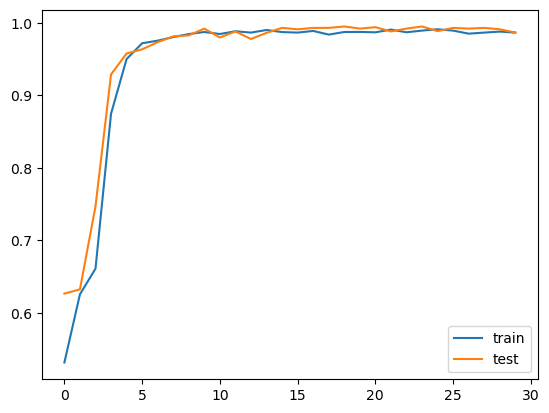

In [49]:
import matplotlib.pyplot as plt
plt.plot(train_accs,label = "train")
plt.plot(test_accs,'-',label = "test")
plt.legend()
plt.show()

In [55]:
with open("graph_dataset_response_title.txt",'rb') as f:
    train_Graphs = pickle.load(f)
data = Batch.from_data_list(train_Graphs)
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation2 = explainer2(data.x.float(),data.edge_index,target = data.y,edge_attr = data.edge_attr,batch_size = data.y.shape[0])
node_mask2 = explanation2.node_mask




In [56]:
node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2

tensor([0.1610, 0.1524, 0.1638, 0.1616, 0.1504, 0.1620, 0.1947, 0.1642, 0.1641,
        0.1505, 0.1473, 0.1768, 0.1614, 0.1482, 0.1651, 0.1612, 0.1612, 0.1483,
        0.1465, 0.1475, 0.1472, 0.1511, 0.1612, 0.1914, 0.1771, 0.1745, 0.1468,
        0.1636, 0.1475, 0.1473, 0.1471, 0.1490, 0.1491, 0.1477, 0.1471, 0.1621,
        0.1633, 0.1604, 0.1482, 0.1780, 0.1474, 0.1621, 0.1520, 0.1908, 0.1805,
        0.1473, 0.1476, 0.1475, 0.1550, 0.1528, 0.1679, 0.1693, 0.1522, 0.1581,
        0.1554, 0.1718, 0.1803, 0.1462, 0.1469, 0.1470, 0.1652, 0.1971, 0.1472,
        0.1482, 0.1647, 0.1479, 0.1484, 0.1777, 0.1469, 0.1501, 0.1469, 0.1614,
        0.1478, 0.1770, 0.1614, 0.1616, 0.1525, 0.1467, 0.1788, 0.1804, 0.2012,
        0.2276, 0.2405, 0.2499, 0.2227, 0.2237, 0.2089, 0.1779, 0.1917, 0.2003,
        0.2288, 0.2069, 0.2477, 0.2174, 0.2385, 0.2569, 0.2696, 0.2920, 0.3136,
        0.3256, 0.3295, 0.2859, 0.2693, 0.2774, 0.2639, 0.2623, 0.2598, 0.2360,
        0.2758, 0.2594, 0.2663, 0.2575, 

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

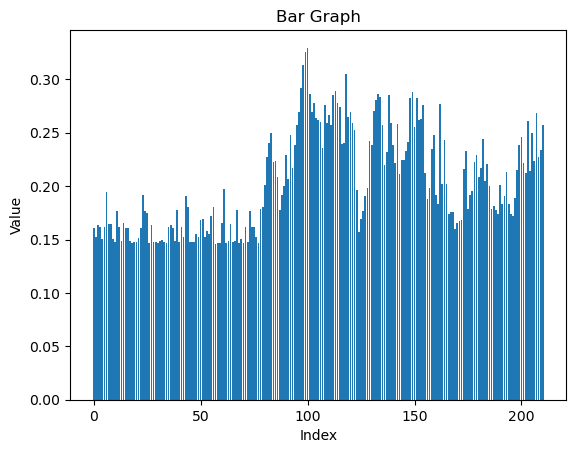

In [57]:
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [58]:
with open("two_original_explanation",'wb') as f:
    pickle.dump((explanation,explanation2),f)

# test the transferbility of data:


In [59]:
####### first transferbility: the performance facing new generated chatgpt data######################
with open("response3_WANS.txt",'rb') as f:
    (val_wordcounts,val_WANS) =pickle.load(f)

In [60]:

def append_human_data(length,Graphs):
    for i in range(len(human_data["all_authors"])):
        print(human_data["all_authors"][i])
        author_excerpts = torch.tensor(human_data["all_wans"][i])

        num_papers = author_excerpts.shape[-1]
        for num in range(length):#num_papers): # keep balanced num between true/false samples
            adj_matrix = author_excerpts[:,:,num]
            signal = human_data["all_freqs"][i][:,num].reshape(-1,1)
            signal = torch.tensor(signal,dtype=torch.float64)
            signal = (signal-signal.mean())/(signal.std())
            y = torch.tensor([[1]])
            adj_matrix = np.array(adj_matrix)

            adj_matrix /= (adj_matrix.sum(axis = 1).reshape(-1,1)+0.0000001)
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)
            edge_index = data.edge_index
            edge_attr = data.weight
            g = Data(x = signal, edge_index = edge_index,edge_attr = edge_attr,y = y) # i define chat gpt's label as zero
            Graphs.append(g)
    return Graphs
def generate_graphs(wordcounts,WANS2,index = 0):
    Graphs = []
    count=0
    for i in range(len(wordcounts)):
        adj_matrix = np.array(WANS2[i])
        #print(val_wordcounts,adj_matrix)
        try:
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)

            edge_index = data.edge_index
            edge_attr = data.weight
            signal = torch.tensor(wordcounts[i],dtype =torch.float64 )

            signal = (signal-signal.mean())/(signal.std())

            g = Data(x = signal.reshape(-1,1), edge_index = edge_index,edge_attr = edge_attr,y = torch.tensor([[index]])) # i define chat gpt's label as zero
            Graphs.append(g)
        except:
            count+=1
            print(data)
            print(count)

    return Graphs

In [61]:
val_graphs =  generate_graphs(val_wordcounts,val_WANS,index = 0)
print(len(val_graphs))
val_graphs = append_human_data(33,val_graphs)

626
['abbott']
['stevenson']
['alcott']
['alger']
['allen']
['austen']
['bronte']
['cooper']
['dickens']
['garland']
['hawthorne']
['james']
['melville']
['page']
['thoreau']
['twain']
['doyle']
['irving']
['poe']
['jewett']
['wharton']


In [62]:
val_loader = DataLoader(val_graphs,batch_size = 128)
test(model,val_loader)

tensor(0.7827)

In [63]:
test(model2,val_loader)


tensor(0.9155)

In [64]:
# apply explnation on it

# new human text with original chatgpt data

In [65]:
with open("poem_graphs.txt",'rb') as f:
    poem_graphs = pickle.load(f)
    print(len(poem_graphs))

889


In [66]:
train_Graphs = generate_graphs(train_wordcounts,train_WANS)
print(len(train_Graphs))

1146


In [67]:
val2_graphs = poem_graphs#+train_Graphs
val2_loader = DataLoader(val2_graphs,batch_size = 128)

In [68]:
print(test(model,val2_loader))
print(test(model2,val2_loader))

tensor(0.1049)
tensor(0.1060)


[[  0   0]
 [801  88]]


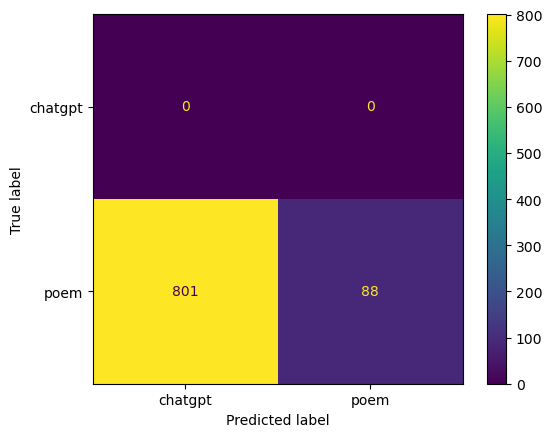

In [69]:
y_true,y_pred = true_predict(model,val2_loader)
print(confusion_matrix(y_true,y_pred))
# plot confusion matrix
cm = confusion_matrix(y_true,y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels = ["chatgpt","poem"])
disp.plot()

# test on long poems

In [70]:

with open("poem_graphs_long.txt",'rb') as f:
    poem_graphs_long = pickle.load(f)
    print(len(poem_graphs_long))

187


In [71]:
val3_graphs_long = poem_graphs_long#+train_Graphs
val3_loader_long = DataLoader(val3_graphs_long,batch_size =64)

In [72]:
print(test(model,val3_loader_long))
print(test(model2,val3_loader_long))

tensor(0.8003)
tensor(0.8203)


/Users/asdfasd/opt/anaconda3/envs/deeplearning/lib/python3.7/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


In [73]:
val_data = Batch.from_data_list(poem_graphs)
val_data2 = Batch.from_data_list(val_graphs)
val_data3 = Batch.from_data_list(poem_graphs_long)

In [74]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_1 = explainer(val_data.x.float(),val_data.edge_index,target = val_data.y,edge_attr = val_data.edge_attr,batch_size = val_data.y.shape[0])





/Users/asdfasd/opt/anaconda3/envs/deeplearning/lib/python3.7/site-packages/torch_geometric/explain/explainer.py:190: UserWarning: The 'target' should not be provided for the explanation type 'model'
  f"The 'target' should not be provided for the explanation "


torch.Size([211, 889])
torch.Size([211])


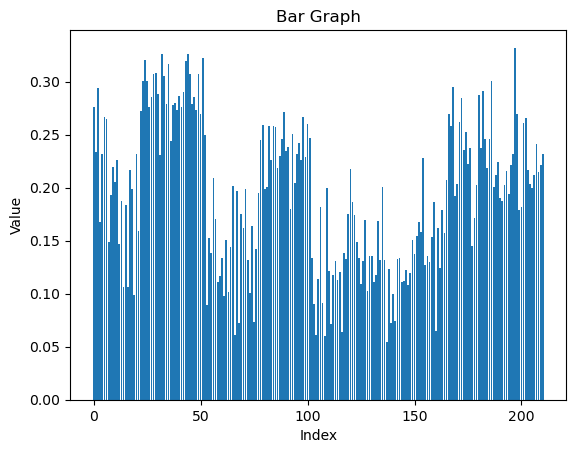

In [75]:
node_mask = explanation3_1.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

torch.Size([211, 1319])
torch.Size([211])


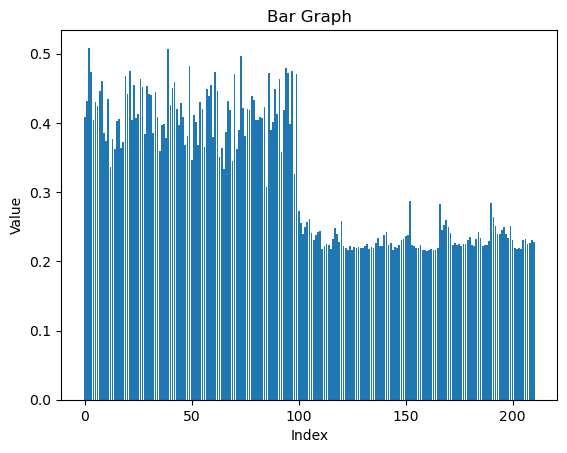

In [76]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_2 = explainer(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask = explanation3_2.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

torch.Size([211, 187])
torch.Size([211])


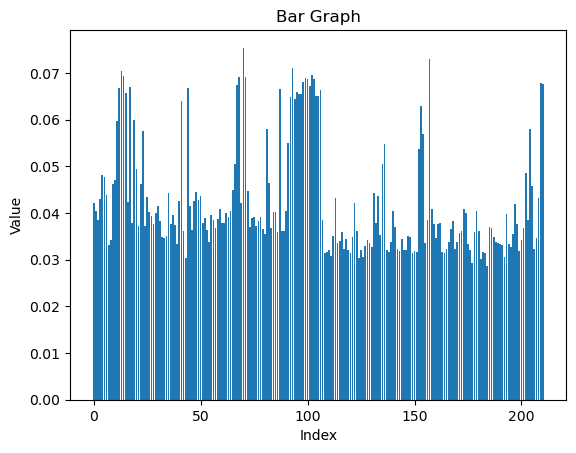

In [77]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_3 = explainer(val_data3.x.float(),val_data3.edge_index,target = val_data3.y,edge_attr = val_data3.edge_attr,batch_size = val_data3.y.shape[0])
node_mask = explanation3_3.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [78]:
with open("explanation_model_transfer.txt",'wb') as f:
    pickle.dump((explanation3_1,explanation3_2,explanation3_3),f)

In [79]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_1 = explainer2(val_data.x.float(),val_data.edge_index,target = val_data.y,edge_attr = val_data.edge_attr,batch_size = val_data.y.shape[0])
node_mask2 = explanation4_1.node_mask

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

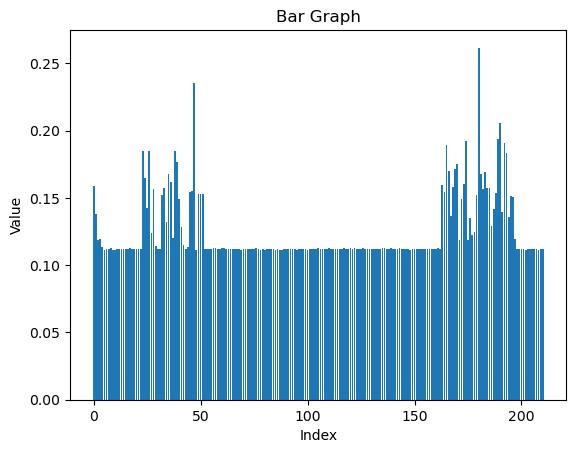

In [80]:

node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [81]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_2 = explainer2(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask2 = explanation4_2.node_mask

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

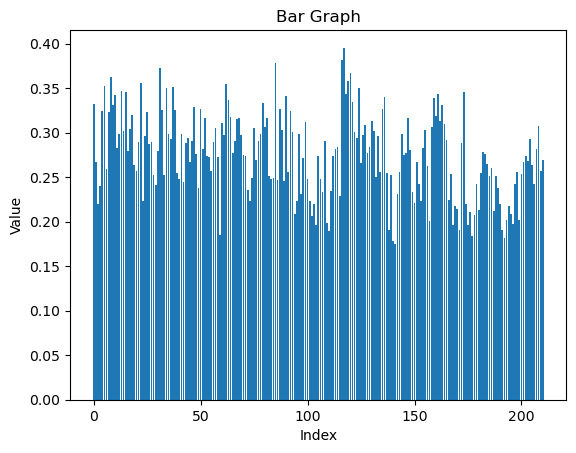

In [82]:
node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

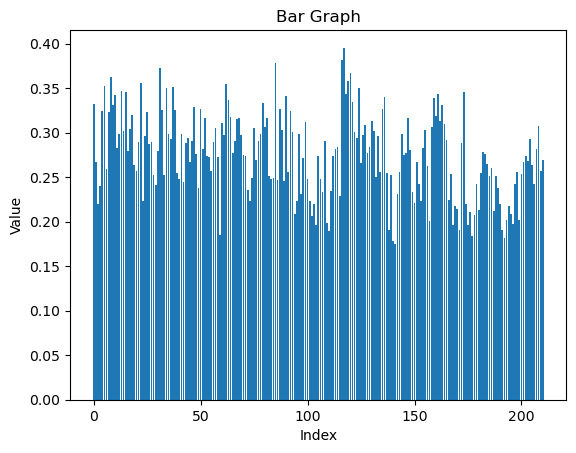

In [83]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_3 = explainer2(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask2 = explanation4_2.node_mask
node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [84]:
with open("explanation_model2_transfer.txt",'wb') as f:
    pickle.dump((explanation4_1,explanation4_2,explanation4_3),f)

In [86]:

print(val_data)
print(val_data2)
print(val_data3)

DataBatch(x=[187579, 1], edge_index=[2, 90579], edge_attr=[90579], y=[889, 1], batch=[187579], ptr=[890])
DataBatch(x=[278309, 1], edge_index=[2, 595442], edge_attr=[595442], y=[1319, 1], batch=[278309], ptr=[1320])
DataBatch(x=[39457, 1], edge_index=[2, 81072], edge_attr=[81072], y=[187, 1], batch=[39457], ptr=[188])


In [97]:

svm_x = np.array(val_data.x)
svm_x = svm_x.reshape(-1,211)
svm_y = np.array(val_data.y).flatten()

clf.score(svm_x,svm_y)

0.24634420697412823

In [98]:

svm_x = np.array(val_data2.x)
svm_x = svm_x.reshape(-1,211)
svm_y = np.array(val_data2.y).flatten()

clf.score(svm_x,svm_y)

0.976497346474602

In [99]:

svm_x = np.array(val_data3.x)
svm_x = svm_x.reshape(-1,211)
svm_y = np.array(val_data3.y).flatten()

clf.score(svm_x,svm_y)

0.8823529411764706

# conclusion:
## it is hard to identify human data
## main reason maybe the gener of original data has not seen poem